# 5x1024 Model analysis. 

* load model and look at confusion matrix and other metrics


# Imports

In [113]:
import os
import gc
import shutil
import glob, pathlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
sns.set_style('darkgrid')
from statistics import mode

os.environ['OPENCV_IO_MAX_IMAGE_PIXELS'] = str(pow(2, 40))
import cv2

# import pyvips
# pyvips.__version__
# #from PIL import Image

# Config

In [114]:
class Config():
    seed = 12
    samples = 7
    tile_size = 1024
    timeout = 100
    thresh = .5
    max_sat = 92.5
    confidence_thresh = .3
    debug = True
    
config = Config()

# Set Path Variables

In [115]:
top_dir = '/kaggle/input/UBC-OCEAN'
test_dir = '/kaggle/input/UBC-OCEAN/test_images/'
train_dir = '/kaggle/input/UBC-OCEAN/train_images/'
test_thumb_dir = '/kaggle/input/UBC-OCEAN/test_thumbnails/'
train_thumb_dir = '/kaggle/input/UBC-OCEAN/train_thumbnails'

# Load Data

In [116]:
ss = pd.read_csv('/kaggle/input/UBC-OCEAN/sample_submission.csv')
train = pd.read_csv('/kaggle/input/UBC-OCEAN/train.csv')
x_test = pd.read_csv('/kaggle/input/UBC-OCEAN/test.csv')
x_test.head()


,image_id,image_width,image_height
0,41,28469,16987


## Set train/test paths, no thumbs for now

In [117]:
from pathlib import Path

def set_test_path(n):

    return Path(f'{test_dir}{n}.png')

def set_train_path(n):
    
    return Path(f'{train_dir}{n}.png')
    
x_test['test_path'] = x_test.image_id.apply(lambda x: set_test_path(x))
train['train_path'] = train.image_id.apply(lambda x: set_train_path(x))

train.head()

,image_id,label,image_width,image_height,is_tma,train_path
0,4,HGSC,23785,20008,False,/kaggle/input/UBC-OCEAN/train_images/4.png
1,66,LGSC,48871,48195,False,/kaggle/input/UBC-OCEAN/train_images/66.png
2,91,HGSC,3388,3388,True,/kaggle/input/UBC-OCEAN/train_images/91.png
3,281,LGSC,42309,15545,False,/kaggle/input/UBC-OCEAN/train_images/281.png
4,286,EC,37204,30020,False,/kaggle/input/UBC-OCEAN/train_images/286.png


In [118]:
train.label.value_counts()

label
HGSC    222
EC      124
CC       99
LGSC     47
MC       46
Name: count, dtype: int64

## Create separate dataframes for each label

In [119]:
train_hgsc = train[train.label=='HGSC']
train_lgsc = train[train.label=='LGSC']
train_ec = train[train.label=='EC']
train_cc = train[train.label=='CC']
train_mc = train[train.label=='MC']

#create a separate for TMA files
train_tma = train[train.is_tma == True]

train_mc.head()


,image_id,label,image_width,image_height,is_tma,train_path
21,2227,MC,60063,40187,False,/kaggle/input/UBC-OCEAN/train_images/2227.png
27,3084,MC,44749,42274,False,/kaggle/input/UBC-OCEAN/train_images/3084.png
36,3997,MC,49467,29610,False,/kaggle/input/UBC-OCEAN/train_images/3997.png
37,4134,MC,2964,2964,True,/kaggle/input/UBC-OCEAN/train_images/4134.png
40,4797,MC,53623,38587,False,/kaggle/input/UBC-OCEAN/train_images/4797.png


# Fastai Model

In [120]:
import fastai
from fastai.vision.all import *
import timm

fastai.__version__

'2.7.12'

## Load/Swap model here
* `20_rndtiles_512_tma_sc_5_epochs_01_lr.pkl` previously gave .42 results

In [121]:
# load learner - 1024x5 models
#learn_inf = load_learner('')
#learn_inf = load_learner('/kaggle/input/ubc-ocean-5-1024-random-tile-model-pkl-files/5x1024_no_sat_tma2x_convnext_tiny_in22k_5_epochs_0.05_lr_0.7085_0.9247.pkl')
#learn_inf = load_learner('/kaggle/input/ubc-ocean-5-1024-random-tile-model-pkl-files/5x1024_tma2x_convnext_tiny_in22k_5_epochs_0.04_lr_0.696.pkl')
learn_inf = load_learner('/kaggle/input/ubc-ocean-5-1024-random-tile-model-pkl-files/5x1024_tma2x_convnext_tiny_in22k_5_epochs_0.05_lr_0.690.pkl')
#learn_inf = load_learner('/kaggle/input/ubc-ocean-5-1024-random-tile-model-pkl-files/5x1024_tma2x_convnext_tiny_in22k_5_epochs_0.05_lr_0.688.pkl')
#learn_inf = load_learner('/kaggle/input/ubc-ocean-5-1024-random-tile-model-pkl-files/5_rndtiles_1024_tma_sc_5_epochs_005_lr.pkl')

print('learner loaded')

learner loaded


In [122]:
# warning: your generator is empty
# error: not enough values to unpack: expected 3 got 2

# interp = ClassificationInterpretation.from_learner(learn_inf)
# interp.plot_confusion_matrix()

# Helper Function for Image Saturation

In [123]:
# helper function to compute percent saturation
def percent_saturation(data):

    tot_pixels = config.tile_size**2
    #print(f'total pixels: {tot_pixels}')
    tot_intensity = data.sum()/(255*3)
    #print(f'total intensity: {tot_intensity}')
    percent_intensity = 100*tot_intensity/tot_pixels
#     if config.debug: 
#         print(f'Percent intensity = {percent_intensity:.2f}%')
    
    return percent_intensity

# Predictions - Validation on Training Data

In [124]:
# THIS HAS TO MATCH TRAINING PIPELINE
# should be generic so I can use the same function for train and test!

def get_random_tile(image, h, w, tile_size,timeout=50):
    
    quality = 0.0
    count = 0
    failed = 0
    half_tile = int(tile_size/2)
    
#     # get width and height
#     h, w = image.shape[0], image.shape[1]
#     if config.debug:
#         print(f'H,W = {h},{w}')

#    # halve TMA files (mabye should have separate classifier for TMA)
#     if w in [2964,3388]:
#         image = cv2.resize(image, None, fx=.5, fy=.5)
#         h, w = h/2,w/2
 
    # come up with a random crop
    while quality < config.thresh:
        
        # get two random values
        rand_h = np.random.randint(0,h-tile_size)
        rand_w = np.random.randint(0,w-tile_size)

        # get params to crop and produce cropped image
        top = rand_h
        left = rand_w
#         if config.debug:
#             print(f'Top, left = {top},{left}')
        
        try: 
            
            im_out = image[top:top+tile_size,left:left+tile_size]
            im_out = cv2.cvtColor(im_out, cv2.COLOR_BGR2RGB)

            zero_count = np.count_nonzero(im_out == 0)
            tot_pixels = 3*tile_size**2
            quality = (tot_pixels - zero_count)/tot_pixels
            
            # check if too saturated and just set quality to zero if higher than we want (i.e. keep same while loop)
            p = percent_saturation(im_out)
            if p > config.max_sat:
                if config.debug:
                    print(f'high p = {p}')
                quality = 0.0  
                count += 1
                
            if config.debug:
#                 plt.figure()
#                 plt.imshow(im_out)
#                 plt.title(f'True label: {true_label}, quality: {quality:.3f}, saturation: {p:.3f}')
#                 plt.show()
                print(f'True label: {true_label}, quality: {quality:.3f}, saturation: {p:.3f}')
            
        except:
            if config.debug:
                print('Exception')
            quality = 0.0
            count +=1 
            
        # if time out, just return an empty image
        if count > timeout:  
            if config.debug:
                print('Timed out, failed image')
            im_out = np.zeros((tile_size,tile_size))
            failed +=1
            break

    return im_out

## Loop through train data, process, and predict

True label: HGSC, quality: 0.000, saturation: 0.000
True label: HGSC, quality: 1.000, saturation: 77.986


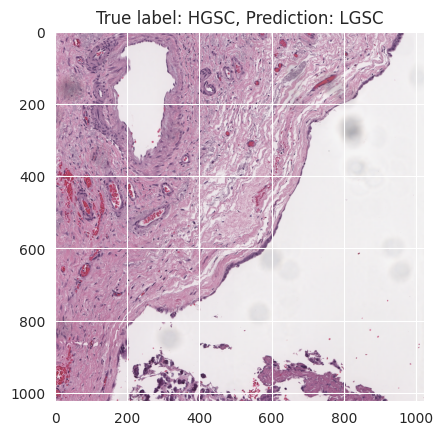

True label: HGSC, quality: 0.121, saturation: 11.471
True label: HGSC, quality: 1.000, saturation: 58.411


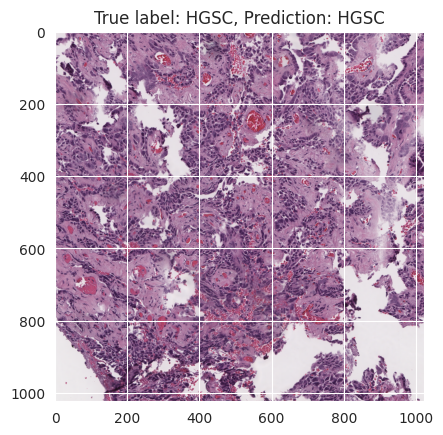

True label: HGSC, quality: 1.000, saturation: 57.290


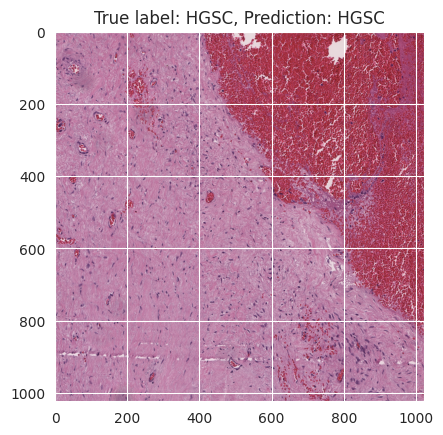

True label: HGSC, quality: 1.000, saturation: 69.651


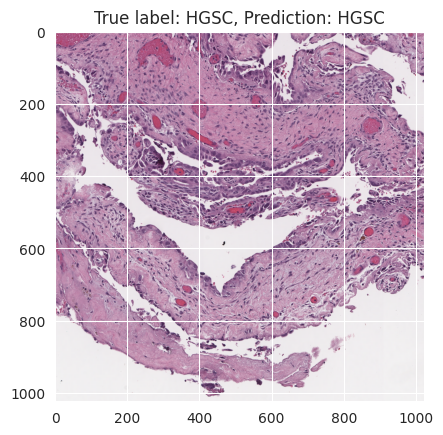

True label: HGSC, quality: 0.990, saturation: 80.132


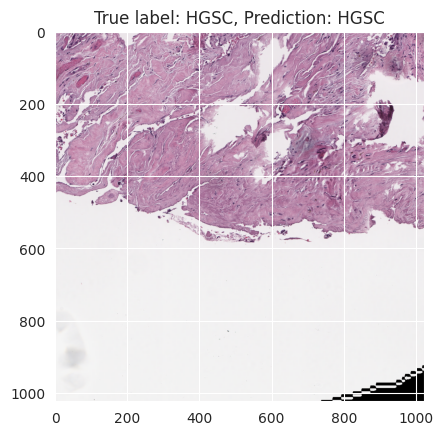

True label: HGSC, quality: 1.000, saturation: 78.123


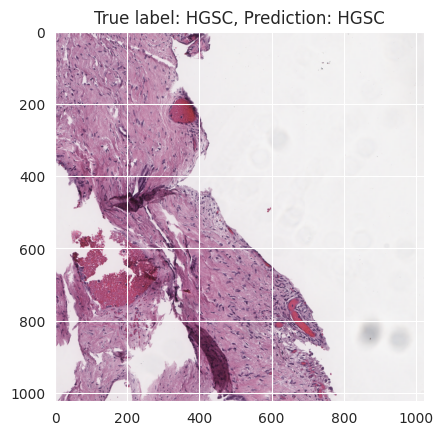

True label: HGSC, quality: 1.000, saturation: 51.194


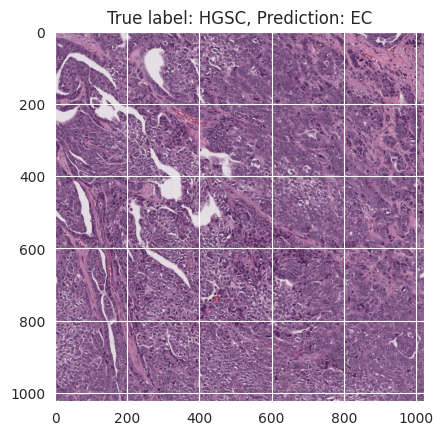

True label: LGSC, quality: 1.000, saturation: 75.057


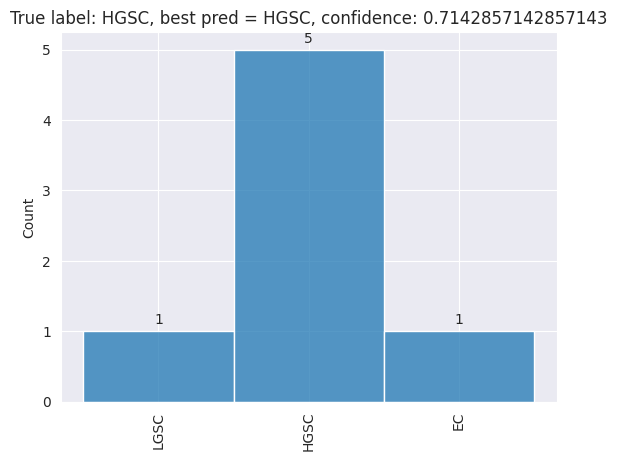

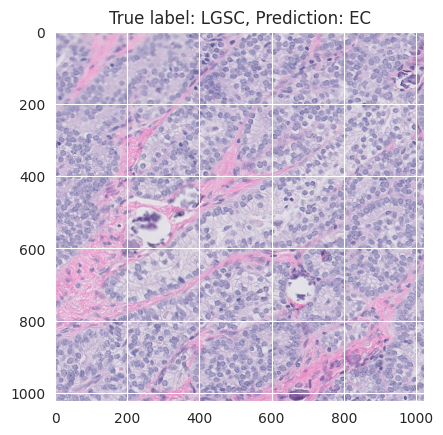

True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 80.241


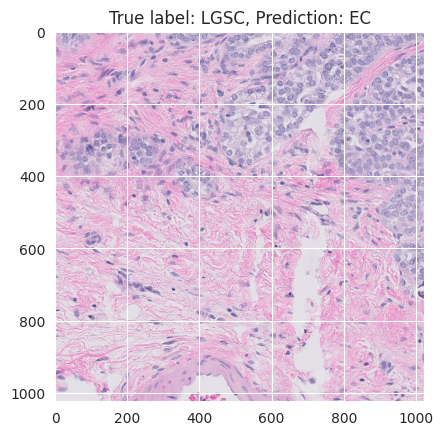

True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 82.718


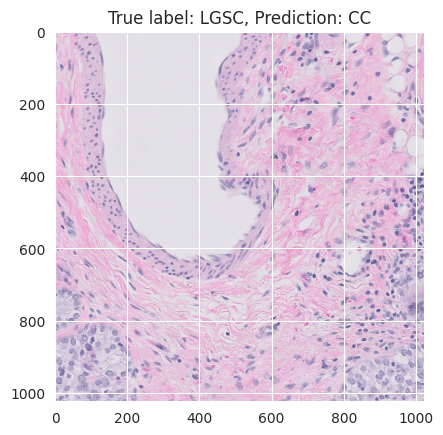

True label: LGSC, quality: 0.939, saturation: 79.410


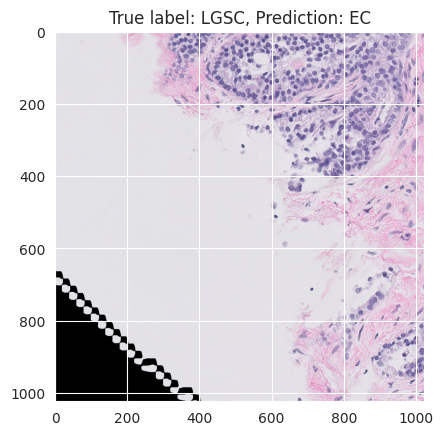

True label: LGSC, quality: 0.259, saturation: 23.181
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 76.217


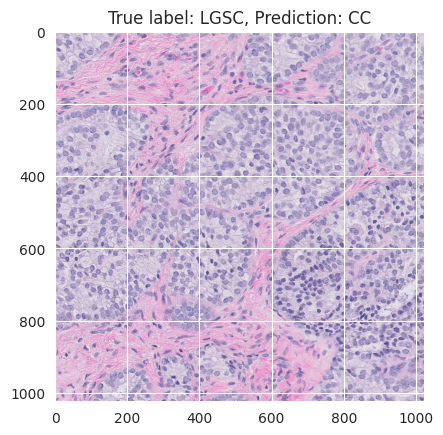

True label: LGSC, quality: 1.000, saturation: 80.699


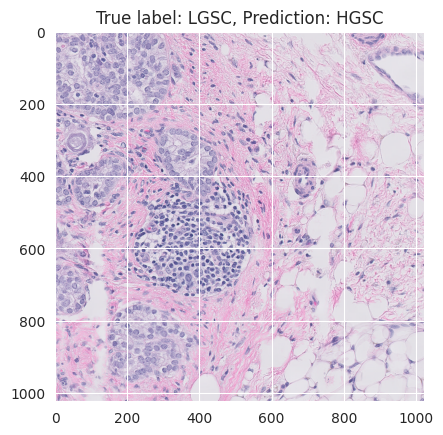

True label: LGSC, quality: 1.000, saturation: 76.635


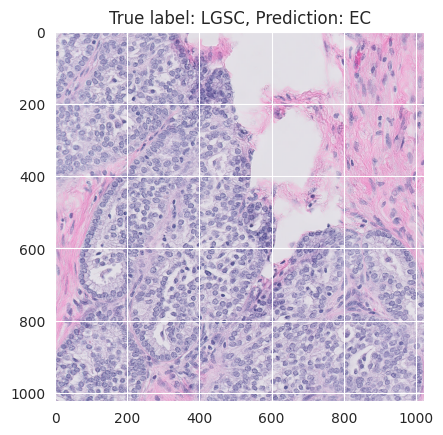

True label: HGSC, quality: 1.000, saturation: 53.066


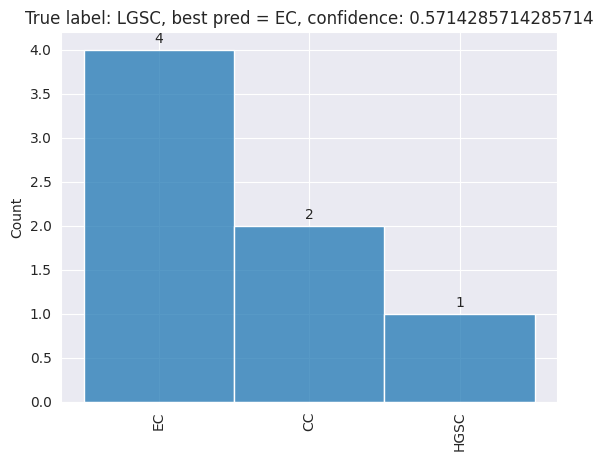

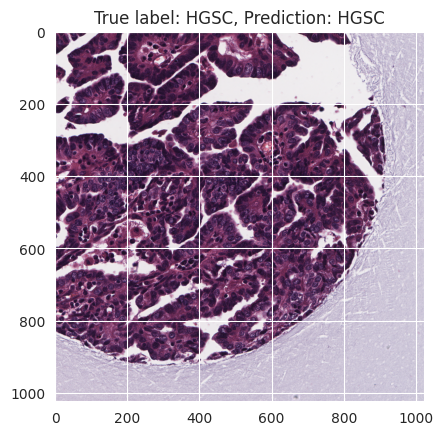

True label: HGSC, quality: 1.000, saturation: 57.669


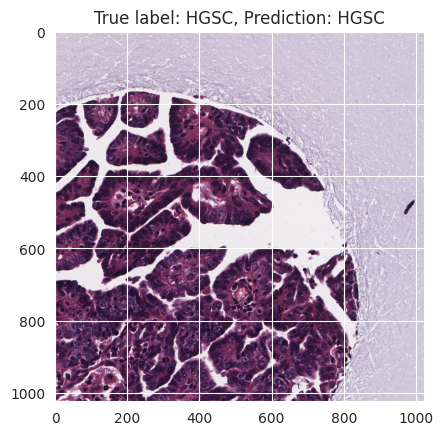

True label: HGSC, quality: 1.000, saturation: 53.671


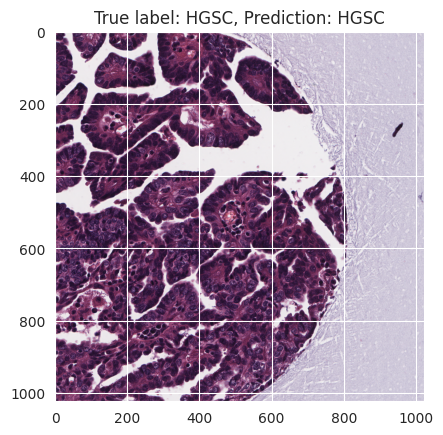

True label: HGSC, quality: 1.000, saturation: 59.062


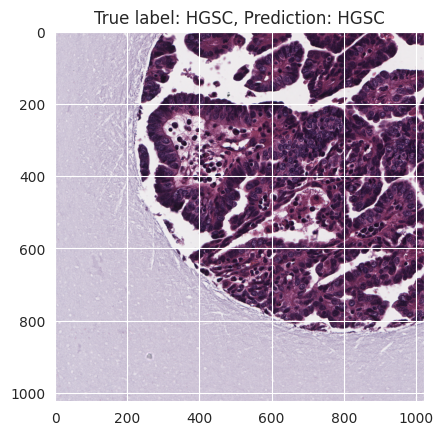

True label: HGSC, quality: 1.000, saturation: 54.683


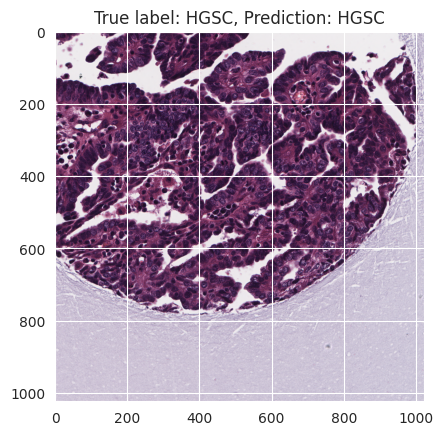

True label: HGSC, quality: 1.000, saturation: 46.442


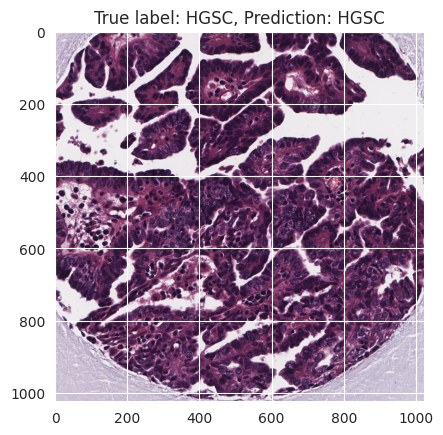

True label: HGSC, quality: 1.000, saturation: 59.619


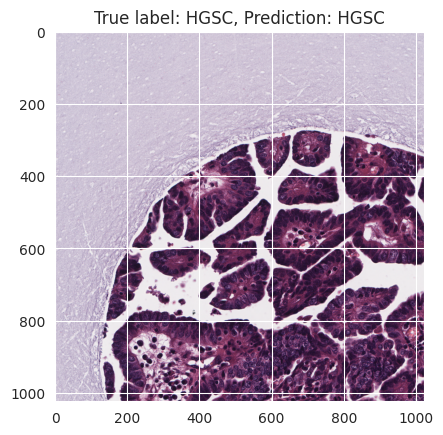

True label: LGSC, quality: 1.000, saturation: 80.962


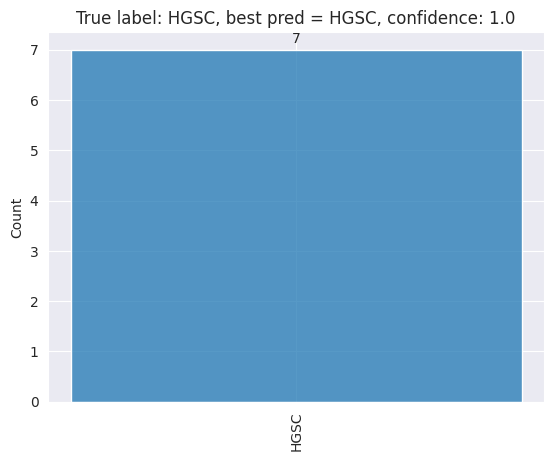

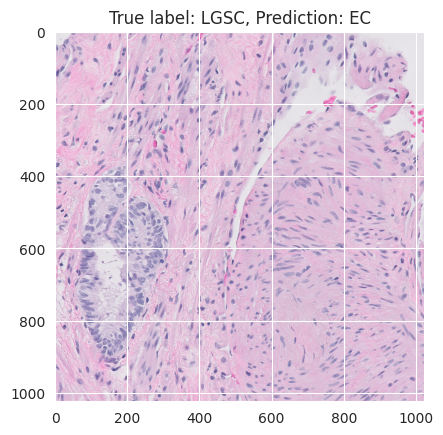

True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.001, saturation: 0.062
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 76.485


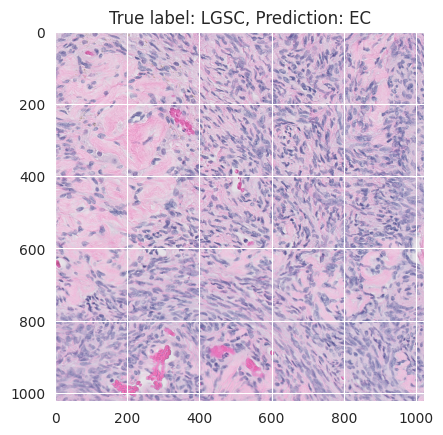

True label: LGSC, quality: 0.311, saturation: 27.909
True label: LGSC, quality: 0.189, saturation: 16.904
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.261, saturation: 23.333
True label: LGSC, quality: 0.002, saturation: 0.200
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.315, saturation: 27.178
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 82.029


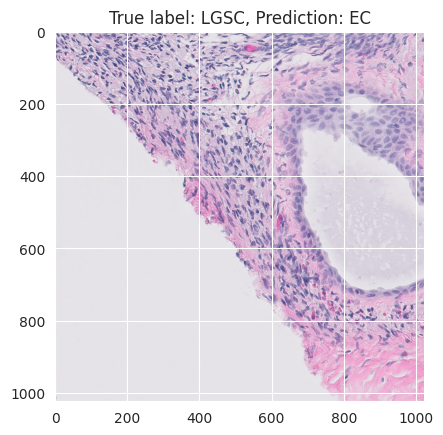

True label: LGSC, quality: 1.000, saturation: 77.397


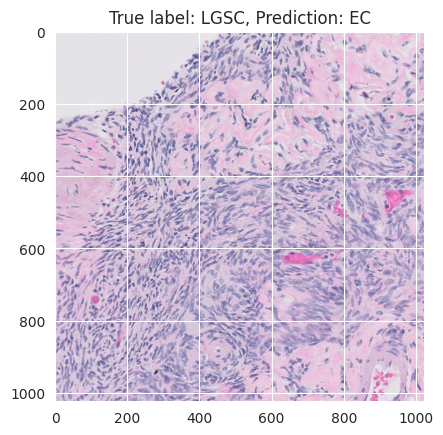

True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 76.965


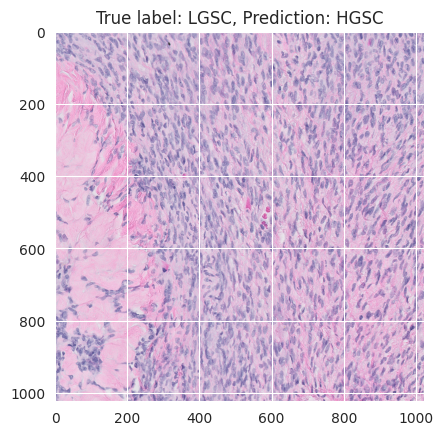

True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 76.242


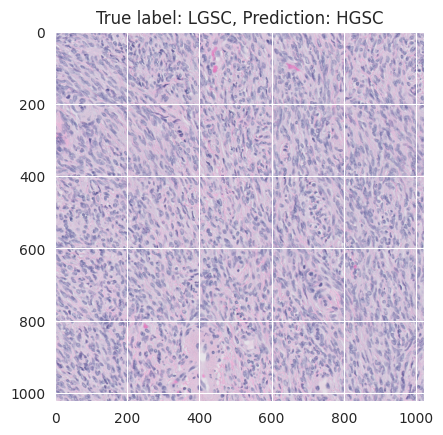

True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 0.000, saturation: 0.000
True label: LGSC, quality: 1.000, saturation: 75.096


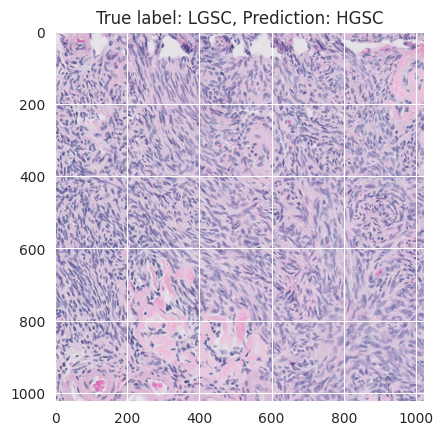

True label: EC, quality: 1.000, saturation: 84.391


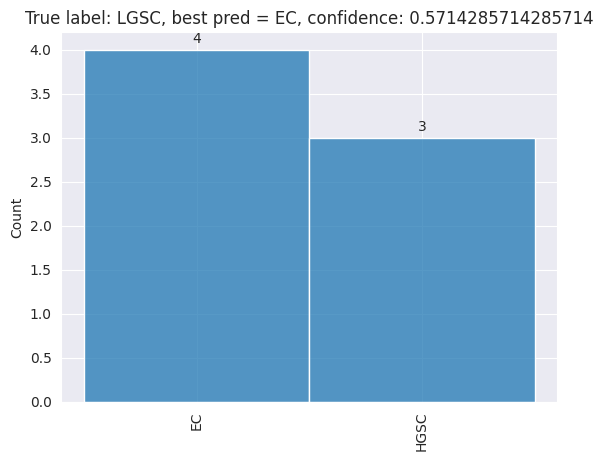

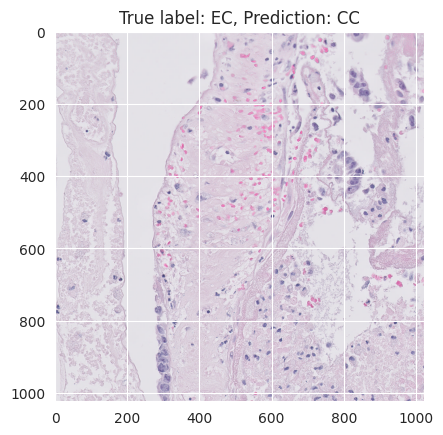

True label: EC, quality: 0.322, saturation: 28.814
True label: EC, quality: 0.000, saturation: 0.000
True label: EC, quality: 0.485, saturation: 43.077
True label: EC, quality: 1.000, saturation: 80.369


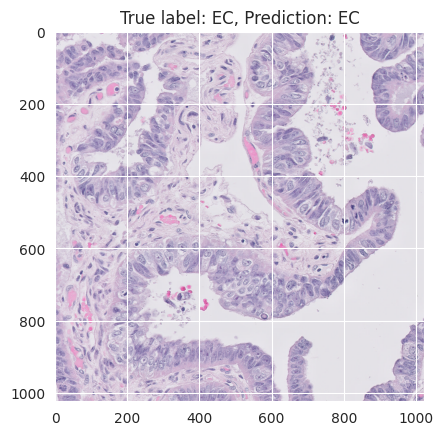

True label: EC, quality: 0.689, saturation: 59.042


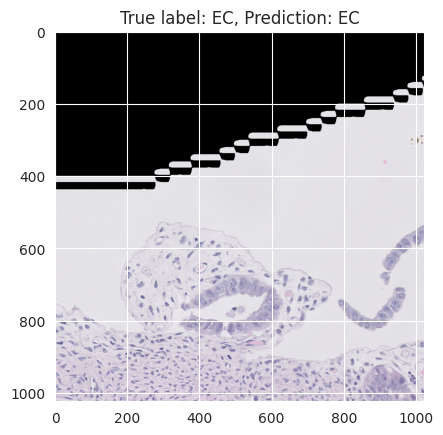

True label: EC, quality: 0.000, saturation: 0.000
True label: EC, quality: 1.000, saturation: 81.612


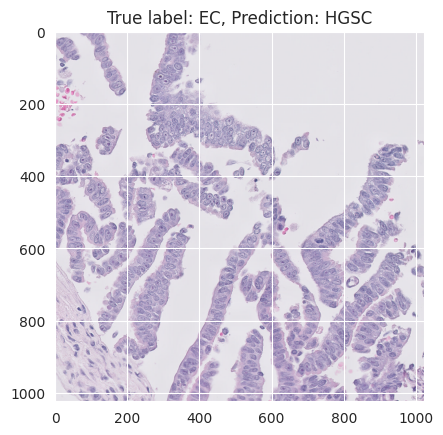

True label: EC, quality: 0.000, saturation: 0.000
True label: EC, quality: 1.000, saturation: 80.644


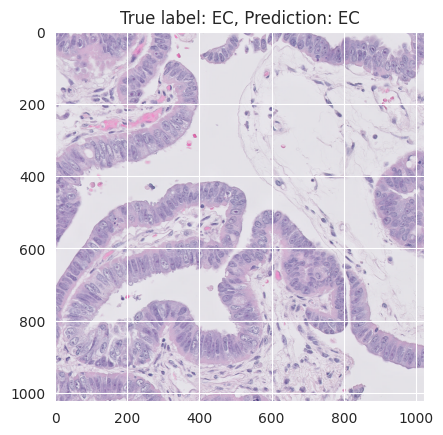

True label: EC, quality: 0.000, saturation: 0.000
True label: EC, quality: 1.000, saturation: 77.245


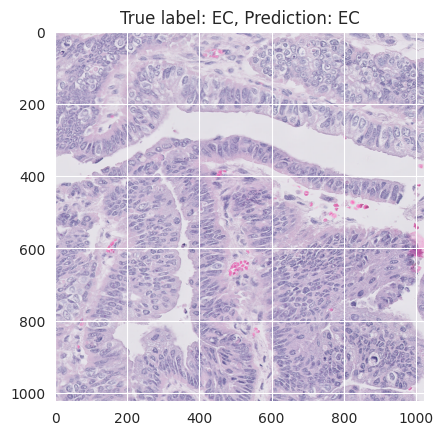

True label: EC, quality: 0.000, saturation: 0.000
True label: EC, quality: 1.000, saturation: 77.026


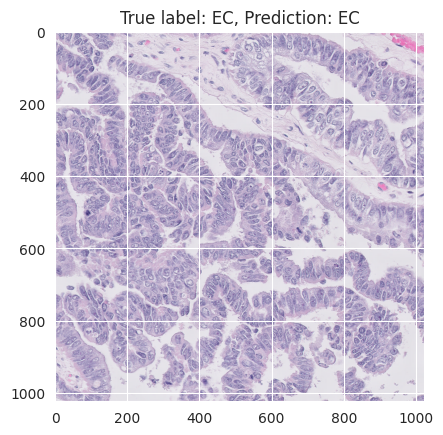

CPU times: user 2min 37s, sys: 18.2 s, total: 2min 55s
Wall time: 2min 41s


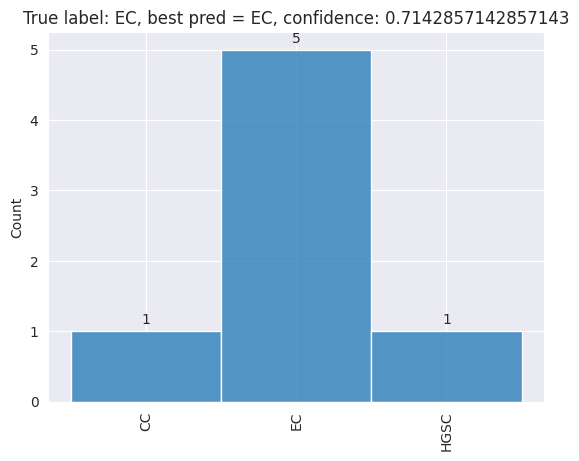

In [129]:
%%time

preds = []

# loop through test and make predictions
for idx in range(5): #len(train)):
    
    # define number of samples
    num_samples = config.samples
    true_label = train.iloc[idx].label
    
    # list to store predictions for this image
    lp_preds = []
        
    #load image with pyvips from path in x_test
    img_path = train.iloc[idx].train_path
    
    # read in image and get h,w
    im = cv2.imread(str(img_path))
    h, w = im.shape[0], im.shape[1]
    
    if w in [2964,3388]:
        im = cv2.resize(im, None, fx=.5, fy=.5)
        h, w = h/2,w/2
        # change num samples?
                   
    # loop for number of samples
    for _ in range(num_samples):
        
        # call function to get random tile
        im_out = get_random_tile(im,h,w,config.tile_size, config.timeout)
         # make predictions on tile (later can extend to use multiple models)
        this_pred = learn_inf.predict(im_out)[0]
        lp_preds.append(this_pred) 
  #     pred2 = learn_inf2.predict(np.asarray(im_out))[0]
  #     pred3 = learn_inf3.predict(np.asarray(im_out))[0]
        
        if config.debug:
            plt.figure()
            plt.imshow(im_out)
            plt.title(f'True label: {true_label}, Prediction: {this_pred}')
            plt.show()

    
    del im
    gc.collect()
    
    best_pred = mode(lp_preds)
    confidence = lp_preds.count(best_pred)/len(lp_preds)
    if confidence < config.confidence_thresh:
        best_pred = 'Other'
        
    if config.debug:
        #print(f'True label: {true_label}, best pred = {best_pred}, confidence: {confidence}')
        myplot = sns.histplot(lp_preds)
        for bar in myplot.patches:
            myplot.annotate(format(bar.get_height(), '.0f'),
                           (bar.get_x() + bar.get_width() / 2,
                            bar.get_height()), ha='center', va='center',
                            size=10, xytext=(0, 8),
                            textcoords='offset points')
        plt.xticks(rotation=90)
        plt.title(f'True label:{true_label}, best pred:{best_pred}, confidence:{confidence:.2f}')
        plt.show()

    preds.append(best_pred)

In [126]:
if config.debug:
    print(lp_preds)

['HGSC', 'EC', 'HGSC', 'LGSC', 'HGSC', 'HGSC', 'HGSC']


In [127]:
#print(lp_preds)

In [128]:
# confidence = lp_preds.count(best_pred)/len(lp_preds)
# print(f'Confidence = {confidence}')

# Test runs (5x) with .005 lr model, confidence values =
# .86,.80,.76,.85, .75

# .690 model:
# .666, .797, .75, .64, .67

